<a href="https://colab.research.google.com/github/kraseliukts/Oil_wells_data_analysis/blob/main/OilWell_data_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Oil well´s data analysis
**Data Analyst - Tatiana Kraseliuk**

Performed dataset cleansing and transformation and created static and interactive graphic with plotly library for Oil Well Data Analysis.

## Library´s installation

In [19]:
pip install plotly==6.0.0rc0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.8/14.8 MB 79.1 MB/s eta 0:00:00
  Attempting uninstall: plotly
    Found existing installation: plotly 5.24.1
    Uninstalling plotly-5.24.1:
      Successfully uninstalled plotly-5.24.1


In [1]:
#import all necessary libraries
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from ipywidgets import widgets
import re

# SUMMIT

##Data transformations

In [2]:
#read csv file (loaded to google colab directly)
data=pd.read_csv("PCN-015 (1).csv", delimiter=",", encoding='latin-1')
data.head(2)

,Date,Time,VSD AMPS,MTR AMPS,VSD VOLTS,VSD FREQ,AI1 VALUE,AI2 VALUE,DC VOLTS,INTK PRESS,...,WIND TEMP,PUMP DIS,VIB X,VIB Y,LEAKAGE,AFE TEMP,VSD TEMP,SENS AMPS,SENS VOLTS,datetime
0,24/12/01,21:06:31,180.0,23.8,469.8,60.0,0,0.0,638.0,210.6,...,310.7,3457.4,0.13,0.17,10.0,0,36,0,119.9,2024-12-01 21:06:31
1,24/12/01,21:07:02,181.0,23.9,469.8,60.0,0,0.0,638.0,210.1,...,310.4,3458.2,0.12,0.18,10.0,0,36,0,120.1,2024-12-01 21:07:02


In [3]:
data.tail(2)

,Date,Time,VSD AMPS,MTR AMPS,VSD VOLTS,VSD FREQ,AI1 VALUE,AI2 VALUE,DC VOLTS,INTK PRESS,...,WIND TEMP,PUMP DIS,VIB X,VIB Y,LEAKAGE,AFE TEMP,VSD TEMP,SENS AMPS,SENS VOLTS,datetime
128885,25/01/17,09:46:37,187.0,24.7,473.4,60.5,0,0.0,636.0,214.5,...,306.9,3756.8,0.10,0.1,10.1,0,38,0,118.0,2025-01-17 09:46:37
128886,25/01/17,09:47:08,184.0,24.3,473.9,60.5,0,0.0,637.0,215.3,...,306.8,3758.9,0.08,0.1,10.0,0,38,0,120.1,2025-01-17 09:47:08


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128887 entries, 0 to 128886
Data columns (total 21 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Date        128887 non-null  object 
 1   Time        128887 non-null  object 
 2   VSD AMPS    128887 non-null  float64
 3   MTR AMPS    128887 non-null  float64
 4   VSD VOLTS   128887 non-null  float64
 5   VSD FREQ    128887 non-null  float64
 6   AI1 VALUE   128887 non-null  int64  
 7   AI2 VALUE   128887 non-null  float64
 8   DC VOLTS    128887 non-null  float64
 9   INTK PRESS  128887 non-null  float64
 10  INTK TEMP   128887 non-null  float64
 11  WIND TEMP   128887 non-null  float64
 12  PUMP DIS    128887 non-null  float64
 13  VIB X       128887 non-null  float64
 14  VIB Y       128887 non-null  float64
 15  LEAKAGE     128887 non-null  float64
 16  AFE TEMP    128887 non-null  int64  
 17  VSD TEMP    128887 non-null  int64  
 18  SENS AMPS   128887 non-null  int64  
 19  SE

In [5]:
#convert the 'datetime', 'Date' and 'Time' columns to an appropiate format
data['datetime']=pd.to_datetime(data['datetime'])

data['Date']=pd.to_datetime(data['Date'], yearfirst=True, format='%y/%m/%d').dt.date
data['Date']=pd.to_datetime(data['Date'], format='%y/%m/%d')

data['Time']=pd.to_datetime(data['Time'], format='%H:%M:%S').dt.strftime('%H:%M:%S')

In [6]:
#set datetime as an index
data = data.set_index('datetime')
data = data.sort_index()

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 128887 entries, 2024-12-01 21:06:31 to 2025-01-17 09:47:08
Data columns (total 20 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   Date        128887 non-null  datetime64[ns]
 1   Time        128887 non-null  object        
 2   VSD AMPS    128887 non-null  float64       
 3   MTR AMPS    128887 non-null  float64       
 4   VSD VOLTS   128887 non-null  float64       
 5   VSD FREQ    128887 non-null  float64       
 6   AI1 VALUE   128887 non-null  int64         
 7   AI2 VALUE   128887 non-null  float64       
 8   DC VOLTS    128887 non-null  float64       
 9   INTK PRESS  128887 non-null  float64       
 10  INTK TEMP   128887 non-null  float64       
 11  WIND TEMP   128887 non-null  float64       
 12  PUMP DIS    128887 non-null  float64       
 13  VIB X       128887 non-null  float64       
 14  VIB Y       128887 non-null  float64       
 15  LEAKAGE     12888

In [8]:
#review the final dataset
data.head(2)

,Date,Time,VSD AMPS,MTR AMPS,VSD VOLTS,VSD FREQ,AI1 VALUE,AI2 VALUE,DC VOLTS,INTK PRESS,INTK TEMP,WIND TEMP,PUMP DIS,VIB X,VIB Y,LEAKAGE,AFE TEMP,VSD TEMP,SENS AMPS,SENS VOLTS
datetime,,,,,,,,,,,,,,,,,,,,
2024-12-01 21:06:31,2024-12-01,21:06:31,180.0,23.8,469.8,60.0,0,0.0,638.0,210.6,212.5,310.7,3457.4,0.13,0.17,10.0,0,36,0,119.9
2024-12-01 21:07:02,2024-12-01,21:07:02,181.0,23.9,469.8,60.0,0,0.0,638.0,210.1,212.5,310.4,3458.2,0.12,0.18,10.0,0,36,0,120.1


In [9]:
data.tail(2)

,Date,Time,VSD AMPS,MTR AMPS,VSD VOLTS,VSD FREQ,AI1 VALUE,AI2 VALUE,DC VOLTS,INTK PRESS,INTK TEMP,WIND TEMP,PUMP DIS,VIB X,VIB Y,LEAKAGE,AFE TEMP,VSD TEMP,SENS AMPS,SENS VOLTS
datetime,,,,,,,,,,,,,,,,,,,,
2025-01-17 09:46:37,2025-01-17,09:46:37,187.0,24.7,473.4,60.5,0,0.0,636.0,214.5,212.9,306.9,3756.8,0.10,0.1,10.1,0,38,0,118.0
2025-01-17 09:47:08,2025-01-17,09:47:08,184.0,24.3,473.9,60.5,0,0.0,637.0,215.3,213.0,306.8,3758.9,0.08,0.1,10.0,0,38,0,120.1


## Data visualizations

### Well name input

In [10]:
well_name=input("Please enter the oil well name: ")

Please enter the oil well name: PCN-015


In [11]:
#define the columns for visualizations
print(data.columns)
columns_1=['INTK PRESS', 'PUMP DIS', 'INTK TEMP', 'WIND TEMP']
columns_2=['VIB X', 'VIB Y']
columns_3=['VSD FREQ', 'MTR AMPS']

Index(['Date', 'Time', 'VSD AMPS', 'MTR AMPS', 'VSD VOLTS', 'VSD FREQ',
       'AI1 VALUE', 'AI2 VALUE', 'DC VOLTS', 'INTK PRESS', 'INTK TEMP',
       'WIND TEMP', 'PUMP DIS', 'VIB X', 'VIB Y', 'LEAKAGE', 'AFE TEMP',
       'VSD TEMP', 'SENS AMPS', 'SENS VOLTS'],
      dtype='object')


### Static graphics

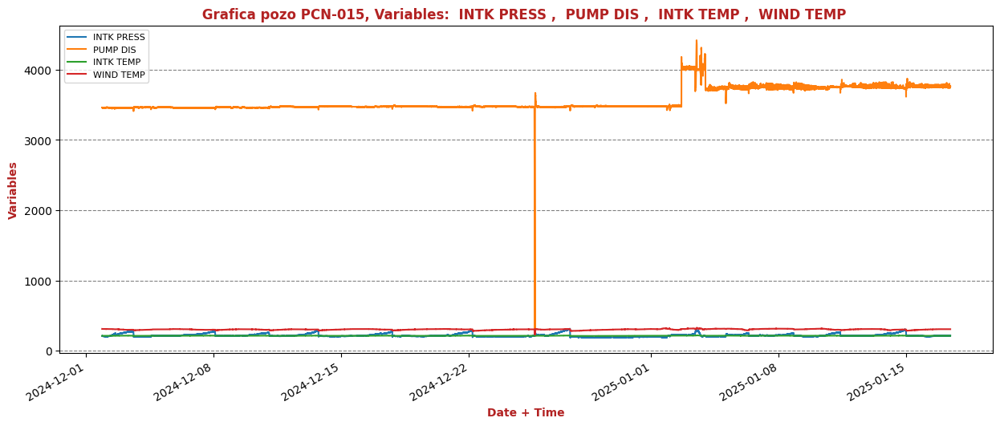

In [12]:
fig, ax=plt.subplots(figsize=(15, 6))

data[columns_1].plot(ax=ax, label='Grafica #1')

ax.set_title(' Grafica pozo ' +str(well_name)+ ', Variables:' +re.sub("[\[|\]|']|\s+|\.|\-", ' ', str(list(data[columns_1].columns))), loc = "Center", fontdict = {'fontsize':12, 'fontweight':'bold', 'color':'firebrick'})

ax.set_xlabel("Date + Time", fontdict = {'fontsize':10, 'fontweight':'bold', 'color':'firebrick'})
ax.set_ylabel("Variables", fontdict = {'fontsize':10, 'fontweight':'bold', 'color':'firebrick'})

ax.legend(prop={'size': 8}, loc = 'upper left')
ax.grid(axis = 'y', color = 'gray', linestyle = 'dashed')

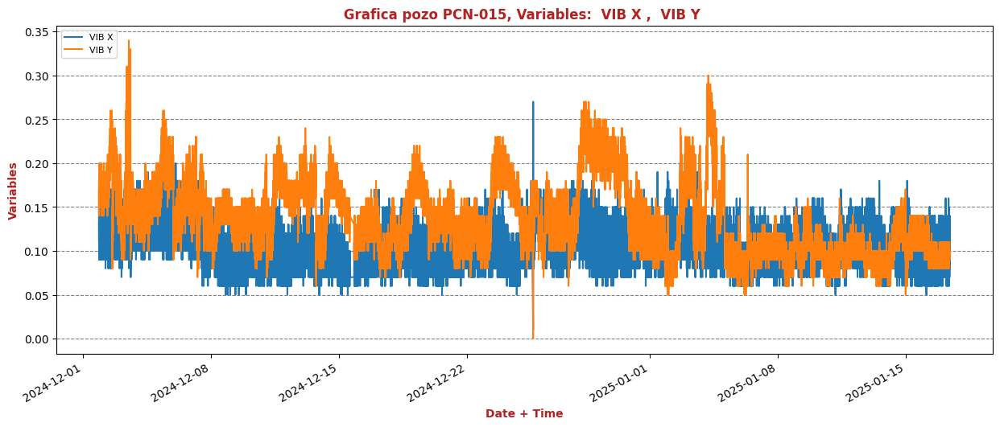

In [13]:
fig, ax=plt.subplots(figsize=(15, 6))

data[columns_2].plot(ax=ax, label='Grafica #2')

ax.set_title(' Grafica pozo ' +str(well_name)+ ', Variables:' +re.sub("[\[|\]|']|\s+|\.|\-", ' ', str(list(data[columns_2].columns))), loc = "Center", fontdict = {'fontsize':12, 'fontweight':'bold', 'color':'firebrick'})

ax.set_xlabel("Date + Time", fontdict = {'fontsize':10, 'fontweight':'bold', 'color':'firebrick'})
ax.set_ylabel("Variables", fontdict = {'fontsize':10, 'fontweight':'bold', 'color':'firebrick'})

ax.legend(prop={'size': 8}, loc = 'upper left')
ax.grid(axis = 'y', color = 'gray', linestyle = 'dashed')

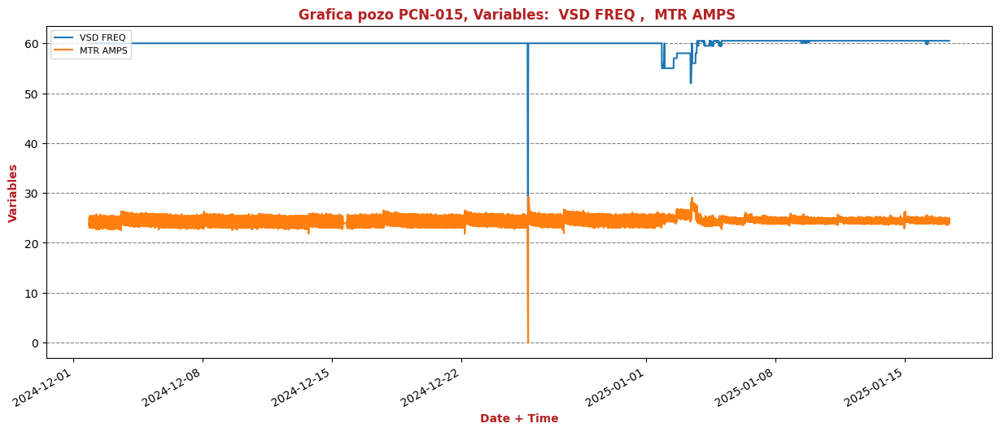

In [14]:
fig, ax=plt.subplots(figsize=(15, 6))

data[columns_3].plot(ax=ax, label='Grafica #3')

ax.set_title(' Grafica pozo ' +str(well_name)+ ', Variables:' +re.sub("[\[|\]|']|\s+|\.|\-", ' ', str(list(data[columns_3].columns))), loc = "Center", fontdict = {'fontsize':12, 'fontweight':'bold', 'color':'firebrick'})

ax.set_xlabel("Date + Time", fontdict = {'fontsize':10, 'fontweight':'bold', 'color':'firebrick'})
ax.set_ylabel("Variables", fontdict = {'fontsize':10, 'fontweight':'bold', 'color':'firebrick'})

ax.legend(prop={'size': 8}, loc = 'upper left')
ax.grid(axis = 'y', color = 'gray', linestyle = 'dashed')

### Interactive graphics

In [15]:
#define the 1st variables to show
column_4=data['VSD AMPS']

#create and visualize the graphic
plot = go.Figure(
    data=[go.Scatter(
    x=data.index,
    y=column_4,
    mode='lines',
    line=dict(color="#0000ff"))
])

plot.update_layout(hovermode="x unified", template='plotly_white',
    xaxis_title='Date + Time',
    yaxis_title='Variable',
    title=' Grafica pozo ' +str(well_name),
    title_font_size=20)

plot.update_layout(
    updatemenus=[
        {
            'buttons': [
                {
                    'label': 'VSD AMPS',
                    'method': 'update',
                    'args': [{'y': [data['VSD AMPS']]}, {'title': 'Grafica pozo ' +str(well_name) + ' Variable: VSD AMPS'}]
                },
                                {
                    'label': 'MTR AMPS',
                    'method': 'update',
                    'args': [{'y': [data['MTR AMPS']]}, {'title': 'Grafica pozo ' +str(well_name) + ' Variable: MTR AMPS'}]
                },
                                {
                    'label': 'VSD VOLTS',
                    'method': 'update',
                    'args': [{'y': [data['VSD VOLTS']]}, {'title': 'Grafica pozo ' +str(well_name) + ' Variable: VSD VOLTS'}]
                },
                                {
                    'label': 'VSD FREQ',
                    'method': 'update',
                    'args': [{'y': [data['VSD FREQ']]}, {'title': 'Grafica pozo ' +str(well_name) + ' Variable: VSD FREQ'}]
                },
                                {
                    'label': 'AI1 VALUE',
                    'method': 'update',
                    'args': [{'y': [data['AI1 VALUE']]}, {'title': 'Grafica pozo ' +str(well_name) + ' Variable: AI1 VALUE'}]
                },
                                {
                    'label': 'AI2 VALUE',
                    'method': 'update',
                    'args': [{'y': [data['AI2 VALUE']]}, {'title': 'Grafica pozo ' +str(well_name) + ' Variable: AI2 VALUE'}]
                },
                {
                    'label': 'DC VOLTS',
                    'method': 'update',
                    'args': [{'y': [data['DC VOLTS']]}, {'title': 'Grafica pozo ' +str(well_name) + ' Variable: DC VOLTS'}]
                },
                {
                    'label': 'INTK PRESS',
                    'method': 'update',
                    'args': [{'y': [data['INTK PRESS']]}, {'title': 'Grafica pozo ' +str(well_name) + ' Variable: INTK PRESS'}]
                },
                {
                    'label': 'WIND TEMP',
                    'method': 'update',
                    'args': [{'y': [data['WIND TEMP']]}, {'title': 'Grafica pozo ' +str(well_name) + ' Variable: WIND TEMP'}]
                },
                                {
                    'label': 'PUMP DIS',
                    'method': 'update',
                    'args': [{'y': [data['PUMP DIS']]}, {'title': 'Grafica pozo ' +str(well_name) + ' Variable: PUMP DIS'}]
                },
                                {
                    'label': 'VIB X',
                    'method': 'update',
                    'args': [{'y': [data['VIB X']]}, {'title': 'Grafica pozo ' +str(well_name) + ' Variable: VIB X'}]
                },
                                {
                    'label': 'VIB Y',
                    'method': 'update',
                    'args': [{'y': [data['VIB Y']]}, {'title': 'Grafica pozo ' +str(well_name) + ' Variable: VIB Y'}]
                },
                                {
                    'label': 'LEAKAGE',
                    'method': 'update',
                    'args': [{'y': [data['LEAKAGE']]}, {'title': 'Grafica pozo ' +str(well_name) + ' Variable: LEAKAGE'}]
                },
                                {
                    'label': 'AFE TEMP',
                    'method': 'update',
                    'args': [{'y': [data['AFE TEMP']]}, {'title': 'Grafica pozo ' +str(well_name) + ' Variable: AFE TEMP'}]
                },
                                {
                    'label': 'VSD TEMP',
                    'method': 'update',
                    'args': [{'y': [data['VSD TEMP']]}, {'title': 'Grafica pozo ' +str(well_name) + ' Variable: VSD TEMP'}]
                },
                                {
                    'label': 'SENS AMPS',
                    'method': 'update',
                    'args': [{'y': [data['SENS AMPS']]}, {'title': 'Grafica pozo ' +str(well_name) + ' Variable: SENS AMPS'}]
                },
                                                {
                    'label': 'SENS VOLTS',
                    'method': 'update',
                    'args': [{'y': [data['SENS VOLTS']]}, {'title': 'Grafica pozo ' +str(well_name) + ' Variable: SENS VOLTS'}]
                },


            ],
            'direction': 'down',
            'showactive': True,
        }
    ]
)


plot.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=7,
                    step="day",
                    stepmode="backward"),
                dict(count=14,
                    step="day",
                    stepmode="backward"),
                dict(count=1,
                    step="month",
                    stepmode="backward"),
                dict(count=6,
                    step="month",
                    stepmode="backward"),
                dict(step="all"),
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
    )
)


plot.show()

# YASKAWA

##Data transformations

In [ ]:
#read csv file (loaded to google colab directly)
data_2=pd.read_csv("PLAN-059.csv", delimiter=",", encoding='latin-1')
data_2.head(2)

,Fecha,Hora,Frecuencia Referencia (Hz),Frecuencia Salida (Hz),Corriente VDF (A),Tensión Salida VDF (V),Tensión Bus DC (V),Corriente T1 Out (A),Corriente T2 Out (A),Corriente T3 Out (A),...,Flujo Másico (Kg/h),Densidad (gr/cm3),BS&W (%),Sensor Toroide 1,Sensor Toroide 2,Sensor Toroide 3,Unidades de Variables,Código de Aplicación,Nombre de Pozo,Eventos y Fallas
0,2/1/2025,5:46:16,57,54.99,166,431.1,660,146,143,135,...,0,0,0,0,0,0,12,7479297,NaN,0
1,2/1/2025,5:46:46,57,54.99,167,431.1,663,145,142,135,...,0,0,0,0,0,0,12,7479297,NaN,0


In [ ]:
data_2.tail(2)

,Fecha,Hora,Frecuencia Referencia (Hz),Frecuencia Salida (Hz),Corriente VDF (A),Tensión Salida VDF (V),Tensión Bus DC (V),Corriente T1 Out (A),Corriente T2 Out (A),Corriente T3 Out (A),...,Flujo Másico (Kg/h),Densidad (gr/cm3),BS&W (%),Sensor Toroide 1,Sensor Toroide 2,Sensor Toroide 3,Unidades de Variables,Código de Aplicación,Nombre de Pozo,Eventos y Fallas
53079,20/01/25,17:45:19,57,54.99,165,431.1,656,145,142,135,...,0,0,0,0,0,0,12,7479297,NaN,0
53080,20/01/25,17:45:48,57,54.99,164,431.1,656,144,141,134,...,0,0,0,0,0,0,12,7479297,NaN,0


In [ ]:
#convert the 'datetime', 'Date' and 'Time' columns to an appropiate format

data_2['Fecha']=pd.to_datetime(data_2['Fecha'], dayfirst=True, format='mixed').dt.date
data_2['Fecha']=pd.to_datetime(data_2['Fecha'], format='%y/%m/%d')

data_2['Hora']=pd.to_datetime(data_2['Hora'], format='%H:%M:%S').dt.strftime('%H:%M:%S')

data_2['datetime'] = data_2['Fecha'].astype(str) + ' ' + data_2['Hora']
data_2['datetime']=pd.to_datetime(data_2['datetime'])

In [ ]:
#set datetime as an index
data_2 = data_2.set_index('datetime')
data_2 = data_2.sort_index()

In [ ]:
data_2.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 53081 entries, 2025-01-02 05:46:16 to 2025-01-20 17:45:48
Data columns (total 40 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Fecha                         53081 non-null  datetime64[ns]
 1   Hora                          53081 non-null  object        
 2   Frecuencia Referencia (Hz)    53081 non-null  int64         
 3   Frecuencia Salida (Hz)        53081 non-null  float64       
 4   Corriente VDF (A)             53081 non-null  int64         
 5   Tensión Salida VDF (V)        53081 non-null  float64       
 6   Tensión Bus DC (V)            53081 non-null  int64         
 7   Corriente T1 Out (A)          53081 non-null  int64         
 8   Corriente T2 Out (A)          53081 non-null  int64         
 9   Corriente T3 Out (A)          53081 non-null  int64         
 10  Corriente Motor (A)           53081 non-null  int64        

In [ ]:
#review the final dataset
data_2.head(2)

,Fecha,Hora,Frecuencia Referencia (Hz),Frecuencia Salida (Hz),Corriente VDF (A),Tensión Salida VDF (V),Tensión Bus DC (V),Corriente T1 Out (A),Corriente T2 Out (A),Corriente T3 Out (A),...,Flujo Másico (Kg/h),Densidad (gr/cm3),BS&W (%),Sensor Toroide 1,Sensor Toroide 2,Sensor Toroide 3,Unidades de Variables,Código de Aplicación,Nombre de Pozo,Eventos y Fallas
datetime,,,,,,,,,,,,,,,,,,,,,
2025-01-02 05:46:16,2025-01-02,05:46:16,57,54.99,166,431.1,660,146,143,135,...,0,0,0,0,0,0,12,7479297,NaN,0
2025-01-02 05:46:46,2025-01-02,05:46:46,57,54.99,167,431.1,663,145,142,135,...,0,0,0,0,0,0,12,7479297,NaN,0


In [ ]:
data_2.tail(2)

,Fecha,Hora,Frecuencia Referencia (Hz),Frecuencia Salida (Hz),Corriente VDF (A),Tensión Salida VDF (V),Tensión Bus DC (V),Corriente T1 Out (A),Corriente T2 Out (A),Corriente T3 Out (A),...,Flujo Másico (Kg/h),Densidad (gr/cm3),BS&W (%),Sensor Toroide 1,Sensor Toroide 2,Sensor Toroide 3,Unidades de Variables,Código de Aplicación,Nombre de Pozo,Eventos y Fallas
datetime,,,,,,,,,,,,,,,,,,,,,
2025-01-20 17:45:19,2025-01-20,17:45:19,57,54.99,165,431.1,656,145,142,135,...,0,0,0,0,0,0,12,7479297,NaN,0
2025-01-20 17:45:48,2025-01-20,17:45:48,57,54.99,164,431.1,656,144,141,134,...,0,0,0,0,0,0,12,7479297,NaN,0


In [ ]:
#well name define
if data_2['Nombre de Pozo'].iloc[0]
#well_name_2=data_2['Nombre de Pozo'].iloc[0]
well_name_2=input("Please enter the oil well name: ")
well_name_2

Please enter the oil well name: PLAN-059


'PLAN-059'

## Data visualizations

### Well name columns selection

In [ ]:
#define the columns for visualizations
print(data_2.columns)
column_2_1=['Presión Intake (Psia)', 'Presión Descarga (Psia)', 'Temperatura Intake (°F)', 'Temperatura Motor (°F)']
column_2_2=['Vibración Eje X (Gs)', 'Vibración Eje Y (Gs)', 'Vibración Eje Z (Gs)']
column_2_3=['Corriente Motor (A)', 'Frecuencia Salida (Hz)']

Index(['Fecha', 'Hora', 'Frecuencia Referencia (Hz)', 'Frecuencia Salida (Hz)',
       'Corriente VDF (A)', 'Tensión Salida VDF (V)', 'Tensión Bus DC (V)',
       'Corriente T1 Out (A)', 'Corriente T2 Out (A)', 'Corriente T3 Out (A)',
       'Corriente Motor (A)', 'Tensión L1 In (VAC)', 'Tensión L2 In (VAC)',
       'Tensión L3 In (VAC)', 'Tensión T1 Out (VAC)', 'Tensión T2 Out (VAC)',
       'Tensión T3 Out (VAC)', 'Potencia Activa Out (KW)',
       'Factor de Potencia Salida ()', 'Presión Intake (Psia)',
       'Presión Descarga (Psia)', 'Temperatura Intake (°F)',
       'Temperatura Motor (°F)', 'Vibración Eje X (Gs)',
       'Vibración Eje Y (Gs)', 'Vibración Eje Z (Gs)',
       'Corriente de Fuga (mA)', 'Corriente de Sistema (mA)',
       'Presión Cabeza (Psia)', 'Temperatura Cabeza (°C)',
       'Flujo Másico (Kg/h)', 'Densidad (gr/cm3)', 'BS&W (%)',
       'Sensor Toroide 1', 'Sensor Toroide 2', 'Sensor Toroide 3',
       'Unidades de Variables', 'Código de Aplicación', 'Nombre 

### Static graphics

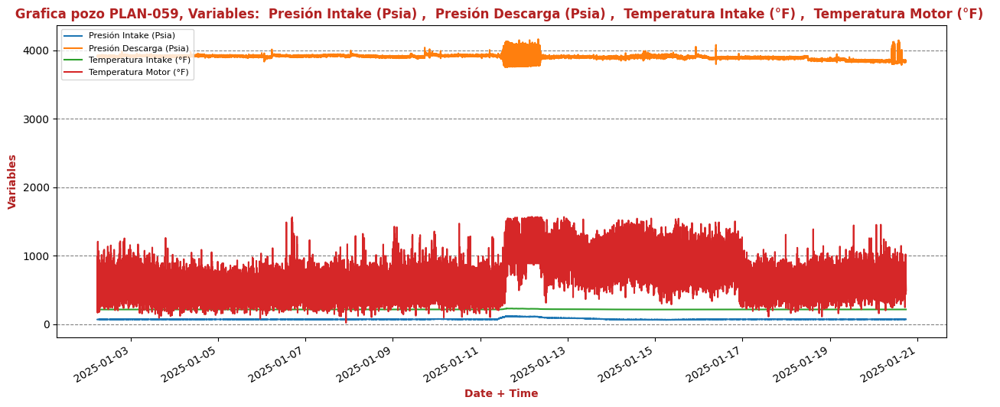

In [ ]:
fig, ax=plt.subplots(figsize=(15, 6))

data_2[column_2_1].plot(ax=ax, label='Grafica #1')

ax.set_title(' Grafica pozo ' +str(well_name_2)+ ', Variables:' +re.sub("[\[|\]|']|\s+|\.|\-", ' ', str(list(data_2[column_2_1].columns))), loc = "Center", fontdict = {'fontsize':12, 'fontweight':'bold', 'color':'firebrick'})

ax.set_xlabel("Date + Time", fontdict = {'fontsize':10, 'fontweight':'bold', 'color':'firebrick'})
ax.set_ylabel("Variables", fontdict = {'fontsize':10, 'fontweight':'bold', 'color':'firebrick'})

ax.legend(prop={'size': 8}, loc = 'upper left')
ax.grid(axis = 'y', color = 'gray', linestyle = 'dashed')

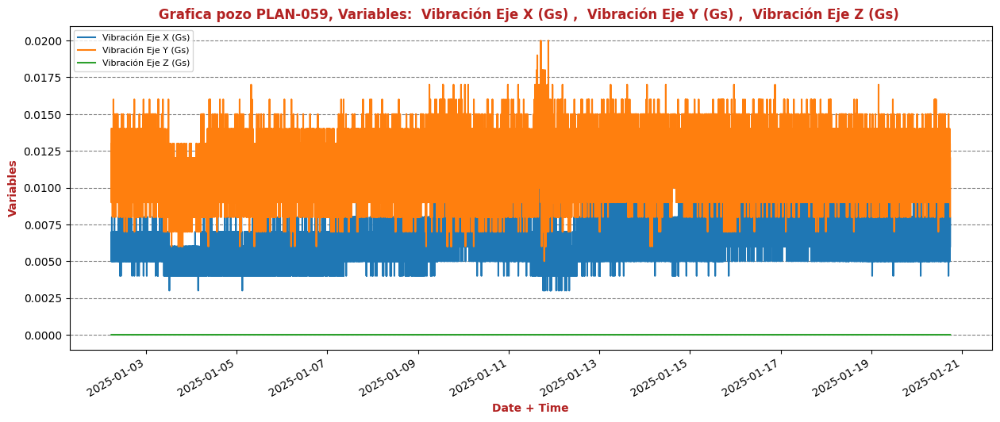

In [ ]:
fig, ax=plt.subplots(figsize=(15, 6))

data_2[column_2_2].plot(ax=ax, label='Grafica #2')

ax.set_title(' Grafica pozo ' +str(well_name_2)+ ', Variables:' +re.sub("[\[|\]|']|\s+|\.|\-", ' ', str(list(data_2[column_2_2].columns))), loc = "Center", fontdict = {'fontsize':12, 'fontweight':'bold', 'color':'firebrick'})

ax.set_xlabel("Date + Time", fontdict = {'fontsize':10, 'fontweight':'bold', 'color':'firebrick'})
ax.set_ylabel("Variables", fontdict = {'fontsize':10, 'fontweight':'bold', 'color':'firebrick'})

ax.legend(prop={'size': 8}, loc = 'upper left')
ax.grid(axis = 'y', color = 'gray', linestyle = 'dashed')

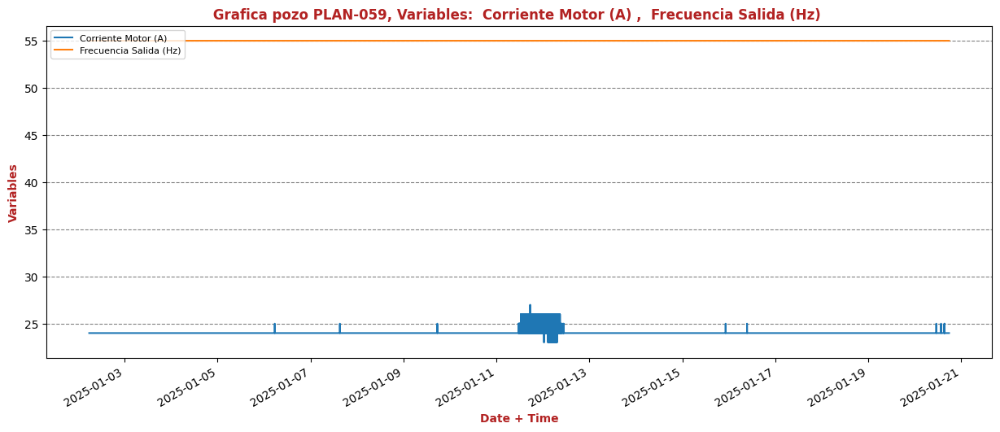

In [ ]:

fig, ax=plt.subplots(figsize=(15, 6))

data_2[column_2_3].plot(ax=ax, label='Grafica #3')

ax.set_title(' Grafica pozo ' +str(well_name_2)+ ', Variables:' +re.sub("[\[|\]|']|\s+|\.|\-", ' ', str(list(data_2[column_2_3].columns))), loc = "Center", fontdict = {'fontsize':12, 'fontweight':'bold', 'color':'firebrick'})

ax.set_xlabel("Date + Time", fontdict = {'fontsize':10, 'fontweight':'bold', 'color':'firebrick'})
ax.set_ylabel("Variables", fontdict = {'fontsize':10, 'fontweight':'bold', 'color':'firebrick'})

ax.legend(prop={'size': 8}, loc = 'upper left')
ax.grid(axis = 'y', color = 'gray', linestyle = 'dashed')

### Interactive graphics

In [ ]:
#define the 1st variables to show
column_2_4=data_2['Presión Intake (Psia)']

#create and visualize the graphic
plot = go.Figure(
    data=[go.Scatter(
    x=data_2.index,
    y=column_2_4,
    mode='lines',
    line=dict(color="#0000ff"))
])

plot.update_layout(hovermode="x unified", template='plotly_white',
    xaxis_title='Date + Time',
    yaxis_title='Variable',
    title=' Grafica pozo ' +str(well_name_2),
    title_font_size=20)

plot.update_layout(
    updatemenus=[
        {
            'buttons': [
                {
                    'label': 'Presión Intake (Psia)',
                    'method': 'update',
                    'args': [{'y': [data_2['Presión Intake (Psia)']]}, {'title': 'Grafica pozo ' +str(well_name_2) + ' Variable: Presión Intake (Psia)'}]
                },
                                {
                    'label': 'Presión Descarga (Psia)',
                    'method': 'update',
                    'args': [{'y': [data_2['Presión Descarga (Psia)']]}, {'title': 'Grafica pozo ' +str(well_name_2) + ' Variable: Presión Descarga (Psia)'}]
                },
                                {
                    'label': 'Temperatura Intake (°F)',
                    'method': 'update',
                    'args': [{'y': [data_2['Temperatura Intake (°F)']]}, {'title': 'Grafica pozo ' +str(well_name_2) + ' Variable: Temperatura Intake (°F)'}]
                },
                                {
                    'label': 'Temperatura Motor (°F)',
                    'method': 'update',
                    'args': [{'y': [data_2['Temperatura Motor (°F)']]}, {'title': 'Grafica pozo ' +str(well_name_2) + ' Variable: Temperatura Motor (°F)'}]
                },
                                {
                    'label': 'Vibración Eje X (Gs)',
                    'method': 'update',
                    'args': [{'y': [data_2['Vibración Eje X (Gs)']]}, {'title': 'Grafica pozo ' +str(well_name_2) + ' Variable: Vibración Eje X (Gs)'}]
                },
                                {
                    'label': 'Vibración Eje Y (Gs)',
                    'method': 'update',
                    'args': [{'y': [data_2['Vibración Eje Y (Gs)']]}, {'title': 'Grafica pozo ' +str(well_name_2) + ' Variable: Vibración Eje Y (Gs)'}]
                },
                {
                    'label': 'Vibración Eje Z (Gs)',
                    'method': 'update',
                    'args': [{'y': [data_2['Vibración Eje Z (Gs)']]}, {'title': 'Grafica pozo ' +str(well_name_2) + ' Variable: Vibración Eje Z (Gs)'}]
                },
                {
                    'label': 'Corriente Motor (A)',
                    'method': 'update',
                    'args': [{'y': [data_2['Corriente Motor (A)']]}, {'title': 'Grafica pozo ' +str(well_name_2) + ' Variable: Corriente Motor (A)'}]
                },
                {
                    'label': 'Frecuencia Salida (Hz)',
                    'method': 'update',
                    'args': [{'y': [data_2['Frecuencia Salida (Hz)']]}, {'title': 'Grafica pozo ' +str(well_name_2) + ' Variable: Frecuencia Salida (Hz)'}]
                },

            ],
            'direction': 'down',
            'showactive': True,
        }
    ]
)


plot.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=7,
                    step="day",
                    stepmode="backward"),
                dict(count=14,
                    step="day",
                    stepmode="backward"),
                dict(count=1,
                    step="month",
                    stepmode="backward"),
                dict(count=6,
                    step="month",
                    stepmode="backward"),
                dict(step="all"),
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
    )
)


plot.show()